# Run HMM for each subject/ROI, in parallel
**[Contributors: Originally written by the Brainiak team, as here: https://brainiak.org/tutorials/12-hmm/.
Adapted later by James Antony.](#contributions)**   
### Goal of this script
 1. Run HMMs, output for Event_HMM_XCond-ROI.ipynb

### Steps of this script
 1. Load event boundary + surprise info + fMRI data from ROI/parcel
 2. Fit HMMs after using cross-validation to find the best number of states
 3. Save timecourses of HMM transitions and HMM transition data w.r.t event boundaries for later alignment
 Note: the plots generated by this script are not placed in the paper (except for the 2-D TRxTR map in Fig 3B), as they only show data limited to one game. For this reason, 'savefig' is largely commented out.

In [1]:
# script for running Hidden Markov models on viewing data
#roitask changes for each // cluster submission. this should go up to nS*nR. 
ipynby=1 #python notebook or not
import numpy as np
import math
if ipynby==0:
    import argparse
    parser = argparse.ArgumentParser()
    parser.add_argument('-roitask', type=str)
    args = parser.parse_args()
    print(args.roitask)
    roitask=args.roitask
    roitask=int(roitask)
if ipynby==1:
    roitask=193
subs=['01','02','03','04','05','06','07','08','09','10','11','12','13','14','15','16','17','18','19','20']#
nS=len(subs)
#ROIs: first 3 for HMMs, next 3 for univariate analyses time-locked to HMMs (without running as HMMs)
ROIs = ['V1','vmPFC','precun','HC','VTA2','NAcc'] 
nROIs=len(ROIs)
roiparcel=2 #run ROIs or parcels? 1=custom ROIs (use 1st 3, next 3 align in univariate way),2=parcel ROIs
if roiparcel==1:
    nR=3#len(ROIs) #changed to 3 to only run these 3 in parallel
elif roiparcel==2:
    nR=48 #hard-coded # of bilateral cortical parcels in Harvard-Oxford atlas
n_trunc=3 # # volumes to truncate
hrshiftval=5 # TRs to shift for HRF
smoothf=7 # +/- smoothing window
filtcutoff=140 #high pass filter cutoff (s)
smoothshift=0 #shift from 0? (unused)
tngs=9 # number of games
overwritefile=1 #1=kill script when the file exists, 0=don't - avoids running duplicates and stealing time on cluster
game_num=math.ceil(roitask/nR) #current game for this roitask
ROI_sel=(roitask-1)%nR #current ROI
if roiparcel==1:
    roi_id=ROIs[ROI_sel] #set current ROI ID for naming
    print('ROI=%s' %roi_id)
elif roiparcel==2:#method to combine left/right parcels
    ROI_sel=ROI_sel*2
print(ROI_sel)
all_task_names = ['view_gb%s' %game_num]
for task_name in all_task_names: 
    q=[]
neu350=0 #if we're using the neuro 350 course Python type
splitm=1 #run split_merge
rerunrois='' #enter '' if don't rerun, otherwise '9' or something
boundtype=0 #holdover variable from a previous way of distinguishing boundaries (as flips in winning team, now done later)
fact4y=1 #use 4-factor model (1) or expert (0?
maxk=30 #max # of states allowed during HMM training, 30
print('Current roitask: %s' %roitask)
print('Current game: %s' %game_num)
print('Current task_name: %s' %task_name)

0
Current roitask: 193
Current game: 5
Current task_name: view_gb5


In [2]:
#load packages
import warnings
import sys 
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import os 
import os.path
from os import path
import glob
import time
from copy import deepcopy
import pandas as pd 
from nilearn import datasets
from nilearn import surface
from nilearn import plotting
from nilearn import image
from nilearn.masking import intersect_masks
from nilearn.input_data import NiftiMasker, NiftiLabelsMasker
import nibabel as nib
import scipy.io
from scipy import stats
from scipy.stats import norm, zscore, pearsonr
from scipy.signal import gaussian, convolve
from brainiak import image, io
import matplotlib.pyplot as plt
import seaborn as sns 
from numpy.polynomial.polynomial import polyfit
import brainiak
import brainiak.eventseg.event
from brainiak.eventseg.event import EventSegment
from sklearn import decomposition
from sklearn.model_selection import LeaveOneOut, KFold
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as patches
if ipynby:
    %autosave 5
    %matplotlib inline
    sns.set(style = 'white', context='talk', font_scale=1, rc={"lines.linewidth": 2})

Autosaving every 5 seconds


In [3]:
#preset variables
from ss_utils import ss_dir, ss_bids_dir, ss_TR, ss_hrf_lag, run_names, n_runs
from ss_utils import load_ss_epi_data, load_ss_mask, mask_data, load_data
results_path=ss_bids_dir+'derivatives/secondlevel/'
firstlevel_dir=ss_bids_dir+'derivatives/firstlevel/'
analysis_dir=ss_dir+'analysis/'
if fact4y==1:
    mat_fname=analysis_dir+'d_event_mat1.mat'
mat_contents = scipy.io.loadmat(mat_fname)
event_mat = mat_contents['event_mat'] 
event_fl = mat_contents['event_fl'] #1st TR for event matrix
p_fl = mat_contents['p_fl'] #1st TR for possession
wc_fl = mat_contents['wc_fl'] #winning team changes
newposs = mat_contents['newposs']
ses='ses-01'
tngs=9
posses=event_mat[:,0]==game_num #extract possessions from game
wincontexts=event_mat[:,0]==game_num #extract win context changes from game
maxedges=math.ceil(np.nanmax(event_mat[posses,3])) #max # possessions in this game
fill=p_fl[:,0]==game_num # #matrix of relevant possessions for this game
fir=np.min(np.where(fill==1)[0])
las=np.max(np.where(fill==1)[0])
sumfill=np.sum(fill) # # possessions in game
if game_num<tngs:
    true_edges=p_fl[fir:las+1+1,1]-event_fl[game_num-1,0]+1 #find times of possession changes 
else:
    true_edges=p_fl[fir:p_fl.shape[0]+1,1]-event_fl[game_num-1,0]+1 #find times of possession changes 
    true_edges=np.hstack([true_edges,event_fl[game_num-1,1]-event_fl[game_num-1,0]+1])
true_edges[len(true_edges)-1]=true_edges[len(true_edges)-1]-2 #move back final # to fit it in JWA 11-2-19
true_edges_sur=p_fl[fill,6] #find amount of surprise for each change in possession

print(maxedges)
print('Possession boundary edges occur at: %s' %true_edges)
print('Surprise at possession edges: %s' %true_edges_sur) 

dir_out = results_path + 'HMM/' #HMM directory
if not os.path.exists(dir_out): #create directory if it doesn't exist
    os.makedirs(dir_out)
    print('Dir %s created ' % dir_out)

16
Possession boundary edges occur at: [  0.  13.  37.  63.  86. 115. 137. 164. 191. 207. 222. 276. 295. 310.
 334. 363. 364.]
Surprise at possession edges: [7.85362538 7.09115461 7.35289738 8.21738833 2.30335556 1.4933497
 0.6326965  1.29414204 5.95831547 5.36534769 2.35168803 0.44142397
 3.81079869 6.36350592 3.89668142 0.        ]


In [4]:
def get_file_names(data_dir_, task_name_,n_trunc_,hrshiftval_,filtcutoff_,verbose = False):
    c_ = 0 
    fnames_ = []
    # Collect all file names 
    for s in range(nS): 
        subj=subs[s]
        if len(str(subj))==1:
            sub ='sub-0'+str(subj)
        else:
            sub ='sub-'+str(subj)
        print(sub)
        fname = os.path.join(
            data_dir_, '%s/%s_task-%s_trim%d_%s_%s.nii.gz' % (sub, sub, task_name_,n_trunc_,hrshiftval_,filtcutoff_))
        print(fname)
        if os.path.exists(fname): # If the file exists
            #print('Exists!')
            # Add to the list of file names 
            fnames_.append(fname)
            if verbose: 
                print(fname)
            c_+= 1
    return fnames_

In [5]:
#find avg brain mask across subjects
mask_imgs=[]
for s in range(nS): 
    subj=subs[s]
    if len(str(subj))==1:
        sub ='sub-0'+str(subj)
    else:
        sub ='sub-'+str(subj)
    mask_fold = ss_bids_dir + 'derivatives/firstlevel/%s/masks/' % sub
    mask_name = mask_fold + '%s_%s_brain.nii.gz' % (sub, ses)    
    mask_imgs.append(mask_name)
    brain_mask1 = io.load_boolean_mask(mask_name)

In [6]:
# intersect 3 'view' run brain masks    
avg_mask_name = results_path + 'avg_brain_mask.nii.gz'
#load in mask as boolean
brain_mask = io.load_boolean_mask(avg_mask_name)# Load the brain mask
coords = np.where(brain_mask)# Get the list of nonzero voxel coordinates
brain_nii = nib.load(avg_mask_name)# Load the brain nii image
print('Brain dimensions:')
print(brain_nii.shape) #brain volume shape

Brain dimensions:
(61, 73, 61)


In [7]:
# load fMRI data 
fnames = {}
images = {}
masked_images = {}
bold = {}
n_subjs = {}
for task_name in all_task_names: 
    fnames[task_name] = get_file_names(firstlevel_dir, task_name,n_trunc,hrshiftval,filtcutoff)
    images[task_name] = io.load_images(fnames[task_name]) 
    masked_images[task_name] = image.mask_images(images[task_name], brain_mask) 
    # Concatenate all of the masked images across participants  
    bold[task_name] = image.MaskedMultiSubjectData.from_masked_images(
        masked_images[task_name], len(fnames[task_name]))
    # Convert nans into zeros
    bold[task_name][np.isnan(bold[task_name])] = 0
    # compute the group assignment label 
    n_subjs_this_task = np.shape(bold[task_name])[-1]
    n_subjs[task_name] = np.shape(bold[task_name])[-1]
    print(n_subjs[task_name])

sub-01
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-01/sub-01_task-view_gb5_trim3_5_140.nii.gz
sub-02
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-02/sub-02_task-view_gb5_trim3_5_140.nii.gz
sub-03
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-03/sub-03_task-view_gb5_trim3_5_140.nii.gz
sub-04
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-04/sub-04_task-view_gb5_trim3_5_140.nii.gz
sub-05
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-05/sub-05_task-view_gb5_trim3_5_140.nii.gz
sub-06
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-06/sub-06_task-view_gb5_trim3_5_140.nii.gz
sub-07
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/firstlevel/sub-07/sub-07_task-view_gb5_trim

In [8]:
# Get list of ROIs. 
sub = 'sub-01' # sample subject for ROI
# Collect all ROIs 
all_roi_nii = {}
all_roi_masker = {}
# Cycle through the masks
for mask_counter in range(nROIs):
    out_dir= ss_bids_dir + 'derivatives/firstlevel/%s/' % sub
    roi_fn = out_dir + '%s_task-view_event%s_%s.mat' % (sub,rerunrois,ROIs[mask_counter])
    roi_name = ROIs[mask_counter]
    if os.path.exists(roi_fn): #load file if it exists
        roi_fn = out_dir + '%s_task-view_event_%s.mat' % (sub,ROIs[mask_counter])
        mat_contents = scipy.io.loadmat(roi_fn)
        epi_masked_data = mat_contents['epi_masked_data']
        print('File found, loading %s' % (roi_fn))
        all_roi_masker[roi_name] = epi_masked_data
    else: #create mask using niftimasker
        roi_fn = out_dir + 'masks/%s_%s.nii.gz' % (sub,ROIs[mask_counter])
        # Load roi nii file 
        roi_nii = nib.load(roi_fn)
        all_roi_nii[roi_name] = roi_nii
        # Make roi maskers
        all_roi_masker[roi_name] = NiftiMasker(mask_img=roi_nii)

In [9]:
#load data for one ROI
lw9=0.5
def load_roi_data(roi_name): 
    roi_masker = all_roi_masker[roi_name] # Pick a roi masker
    bold_roi = {task_name:[] for i, task_name in enumerate(all_task_names)} # Preallocate 
    for task_name in all_task_names: # Gather data
        for subj_id in range(n_subjs[task_name]):
            # Get the data for task t, subject s 
            nii_t_s = nib.load(fnames[task_name][subj_id])
            bold_roi[task_name].append(roi_masker.fit_transform(nii_t_s))
        # Reformat the data to std form 
        bold_roi[task_name] = np.transpose(np.array(bold_roi[task_name]), [1,2,0])
    return bold_roi

#function for similarity matrix
def plot_tt_similarity_matrix(ax, data_matrix, bounds, bounds_true, n_TRs):
    ax.imshow(np.corrcoef(data_matrix.T), cmap='viridis')
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(lw9)
    # plot HMM predicted boundaries 
    bounds_aug = np.concatenate(([0],bounds,[n_TRs]))
    for i in range(len(bounds_aug)-1):
        rect = patches.Rectangle(
            (bounds_aug[i],bounds_aug[i]),
            bounds_aug[i+1]-bounds_aug[i],
            bounds_aug[i+1]-bounds_aug[i],
            linewidth=lw9,edgecolor='w',facecolor='none')
        ax.add_patch(rect)
    bounds_aug = np.concatenate(([0],bounds_true,[n_TRs]))
    for i in range(len(bounds_aug)-1):
        rect = patches.Rectangle(
            (bounds_aug[i],bounds_aug[i]),
            bounds_aug[i+1]-bounds_aug[i],
            bounds_aug[i+1]-bounds_aug[i],
            linewidth=lw9,edgecolor='r',facecolor='none')
        ax.add_patch(rect)

#function for running max
def running_max(x, N):
    rm=np.zeros((x.shape[0]))
    for i in range(len(x)):
        if i<N:
            rm[i]=np.max(x[0:i+N+1])#max
        elif i>len(x)-1-N:
            rm[i]=np.max(x[i-N:len(x)-1+1])
        else:
            rm[i]=np.max(x[i-N:i+N+1])
    return rm

#function for running mean
def running_mean(x, N,shift):
    rm=np.zeros((x.shape[0]))
    for i in range(0,len(x)):
        if i<N+shift:
            rm[i]=np.mean(x[0:(i+N)+shift+1])
        elif i>len(x)-1-N+shift:
            rm[i]=np.mean(x[(i-N)+shift:len(x)-1+1])
        else:
            rm[i]=np.mean(x[(i-N)+shift:(i+N)+shift+1])
    return rm

#simple violin plot
def vplot(true,dist,yl,rankd,sps,sp):
    tt='true percentile = %s' %rankd
    if sps>1:
        ax[sp].violinplot(dist, showextrema=False)
        ax[sp].scatter(1,true)
        ax[sp].xaxis.set_visible(False)
        ax[sp].set_ylabel(yl)
        ax[sp].set_title(tt)
    else:
        ax.violinplot(dist, showextrema=False)
        ax.scatter(1,true)
        ax.xaxis.set_visible(False)
        ax.set_ylabel(yl)
        ax.set_title(tt)

In [10]:
# Load ROI one at a time (This script runs in parallel on the cluster)
#HC/VTA/NAcc are for activity in these regions aligned with HMM event boundaries
HC_m=[]
VTA2_m=[]
NAcc_m=[]
if roiparcel==1:
    for j in range(ROI_sel,ROI_sel+1): #enumerate(ROIs):
        roi_name=ROIs[j]
        bold_roi = load_roi_data(roi_name) # Load data
        print('ROI name: %s' %roi_name)
        print(bold_roi[task_name].shape)
if ROI_sel==0: #save these time courses if on the first ROI (same for all)
    HC_roi=load_roi_data('HC') 
    HC_m=np.mean(HC_roi[task_name],axis=1)
    VTA2_roi=load_roi_data('VTA2')
    VTA2_m=np.mean(VTA2_roi[task_name],axis=1)
    NAcc_roi=load_roi_data('NAcc')
    NAcc_m=np.mean(NAcc_roi[task_name],axis=1)

{'maps': <nibabel.nifti1.Nifti1Image object at 0x7f54b8c8b890>, 'labels': ['Background', 'Left Frontal Pole', 'Right Frontal Pole', 'Left Insular Cortex', 'Right Insular Cortex', 'Left Superior Frontal Gyrus', 'Right Superior Frontal Gyrus', 'Left Middle Frontal Gyrus', 'Right Middle Frontal Gyrus', 'Left Inferior Frontal Gyrus, pars triangularis', 'Right Inferior Frontal Gyrus, pars triangularis', 'Left Inferior Frontal Gyrus, pars opercularis', 'Right Inferior Frontal Gyrus, pars opercularis', 'Left Precentral Gyrus', 'Right Precentral Gyrus', 'Left Temporal Pole', 'Right Temporal Pole', 'Left Superior Temporal Gyrus, anterior division', 'Right Superior Temporal Gyrus, anterior division', 'Left Superior Temporal Gyrus, posterior division', 'Right Superior Temporal Gyrus, posterior division', 'Left Middle Temporal Gyrus, anterior division', 'Right Middle Temporal Gyrus, anterior division', 'Left Middle Temporal Gyrus, posterior division', 'Right Middle Temporal Gyrus, posterior divisi

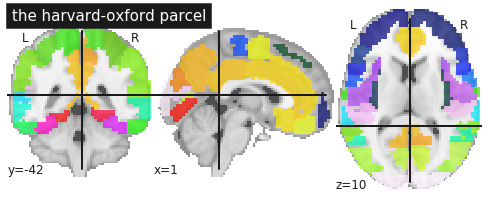

In [11]:
#Harvard-Oxford atlas parcels
proc=0 #proceed?
if roiparcel==1:
    if ROI_sel==1000: #set to 0 to use precuneus from Harv/Ox
        proc=1
        roi_temp=30*2 #use this @ and it'll combine left/right below
elif roiparcel==2:
    proc=1
    roi_temp=ROI_sel
if proc==1:
    from nilearn import image
    from nilearn.image.image import mean_img
    from nilearn.image import resample_to_img
    from nilearn.datasets import load_mni152_template
    #grab atlas
    atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm', symmetric_split=True)
    print(atlas)
    i=np.eye(3)*3 #identity matrix to resample to 3 mm isometric voxels
    atlas.maps=image.resample_img(atlas.maps, target_affine=i,interpolation='nearest') #resample
    if ipynby==1:
        plotting.plot_roi(atlas.maps, title='the harvard-oxford parcel') #quick parcels plot
    nP = len(atlas.labels)-1 # rm background region 
    print('number of unilateral parcels:\t {}'.format(nP))
    masker_ho=NiftiLabelsMasker(labels_img=atlas.maps) #parcel labels
    index=masker_ho.labels_img.dataobj
    parcels=atlas.labels
    parcels[51]='Left Juxtapositional Lobule Cortex' #shorten parcel 51/52 labels
    parcels[52]='Right Juxtapositional Lobule Cortex'
    template = load_mni152_template() #load MNI template
    template =image.resample_img(template, target_affine=i,interpolation='nearest') #resample
    
    #must put bold data into 3-D space for alignment with parcels
    if neu350==1:
        if bold[task_name].shape[0]>10000: #if haven't already swapped dimensions
            bold[task_name]=np.transpose(bold[task_name], [1,0,2])
    nTR=bold[task_name].shape[0]
    #print('BOLD data shape: %s' %(bold[task_name].shape))
    roi_id=parcels[roi_temp+1] #assign roi_id on this iteration
    print('Parcel:%s' %roi_id)
    curr3d = np.zeros(brain_nii.shape) 
    bold_roi={}
    for parcel in range(roi_temp,roi_temp+1):#grab only the 'left' temp parcel
        print(parcel)
        #previous way that does NOT bilateralize
        #fill2 = index==parcel+1# rm background region 
        #remove background region + bilateralize - > parcel and < parcel+3 to combine
        fill2 = np.logical_and(index>parcel,index<parcel+3) #use overlap
        roi_coords=np.logical_and(brain_mask>0,fill2>0) #assign to correct coordinates
        for subj in range(nS):
            fill=np.zeros(brain_nii.shape)
            if subj == 0:
                nV =fill[roi_coords].shape[0]# voxels in this parcel
                bold_roi[task_name]=np.zeros((nTR,nV,nS))
            for TR in range(nTR):
                curr3d[coords]=bold[task_name][TR,:,subj]
                # now create a bold parcel data set for spatial ISC
                bold_roi[task_name][TR,:,subj]=curr3d[roi_coords]

In [12]:
#check if file already exists and kill script if it does, depending on 'overwritefile'
#this saves a lot of unnecessary processing time on the cluster if the output exists
mat_fname=dir_out+'event_hmm129_out%s-%s-%s-%s-%s-%s-%s-%s-%s.mat' %(smoothf,smoothshift,n_trunc,hrshiftval,boundtype,task_name,roi_id,splitm,filtcutoff)
print(mat_fname)
print(path.exists(mat_fname))
if overwritefile:
    if path.exists(mat_fname): #kill script if file exists!
        thiswillkillthescript=italreadyexists

/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/secondlevel/HMM/event_hmm129_out7-0-3-5-0-view_gb5-Left Frontal Pole-1-140.mat
False


In [13]:
#plot 2-D matrices and find sample HMM boundaries using a fixed K (true # of possessions)
D = np.transpose(bold_roi[task_name], [1,0,2])
print(D.shape)
for subj in range(nS):
    zmat=np.std(D[:,:,subj],axis=1)>0
    if subj==0:
        zzmat=zmat
    else:
        zzmat=zzmat & zmat
D=bold_roi[task_name][:,zzmat,0].T
print(D.shape)

(4509, 366, 20)
(4264, 366)


4264


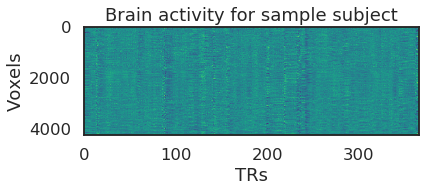

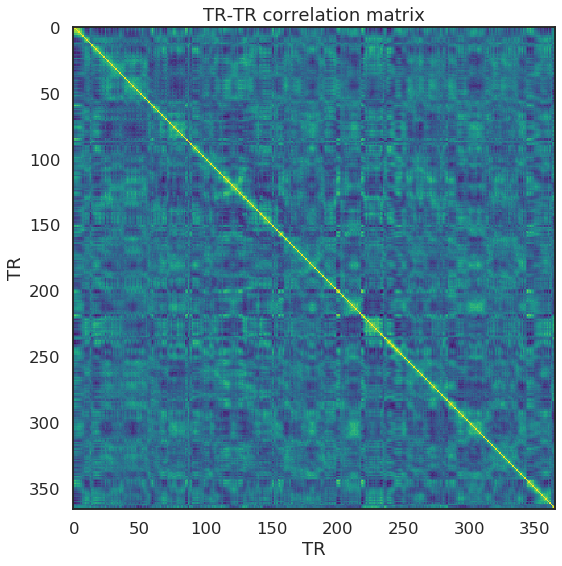

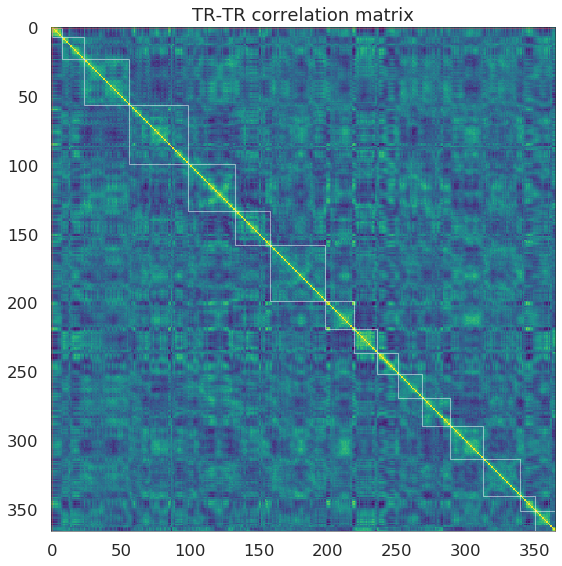

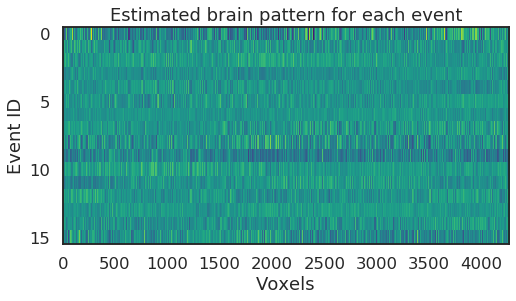

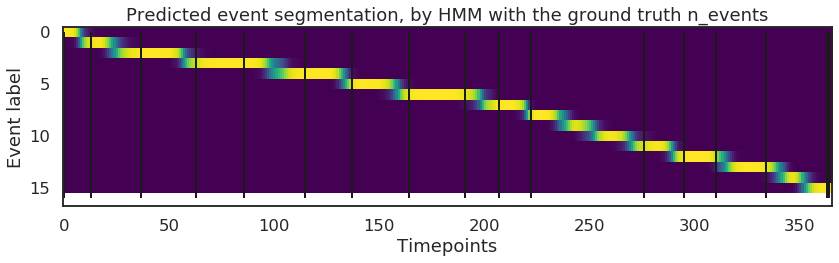

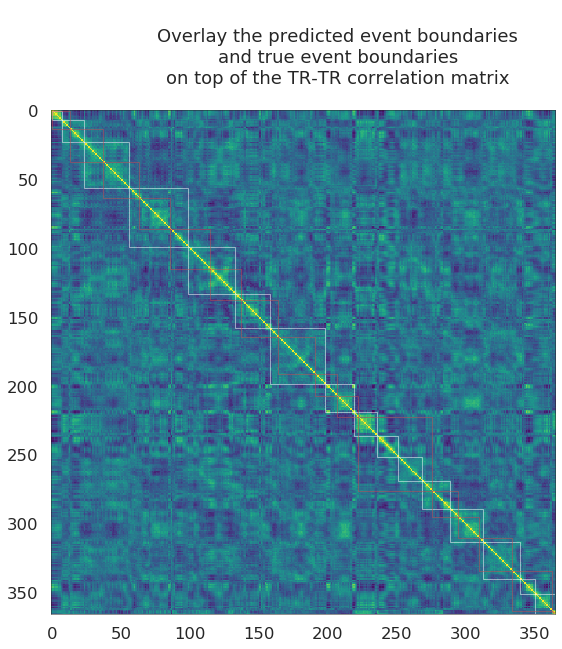

In [14]:
#other examples of HMM boundaries - this part of the script is very Brainiak tutorial-y
V = D.shape[0] # number of voxels
K = maxedges # number of possessions
T = bold_roi[task_name].shape[0] # Time points
bounds_subj_fixk=np.zeros((nS,T))
bounds_subj_smooth_fixk=np.zeros((nS,T))
print(V)
for subj in range(nS):
    D = bold_roi[task_name][:,zzmat,subj].T
    zmat=D[:,1]!=0
    D=D[zmat,:]
    # Find the events in this dataset
    if splitm:
        hmm_sim = EventSegment(K,split_merge=True)
    else:
        hmm_sim = EventSegment(K)
        
    hmm_sim.fit(D.T)
    pred_seg = hmm_sim.segments_[0]
    # extract the boundaries 
    bs=np.where(np.diff(np.argmax(pred_seg, axis=1)))[0]
    bounds_subj_fixk[subj,bs] = 1 # mark the boundaries in the continuous space
    bounds_subj_smooth_fixk[subj,:]=running_mean(bounds_subj_fixk[subj,:],smoothf,smoothshift)
    if ipynby==1:
        if subj==0: # plot the data for sample subject
            f, ax = plt.subplots(1,1, figsize=(6, 2))
            ax.imshow(D, interpolation='nearest', cmap='viridis', aspect='auto')
            ax.set_ylabel('Voxels')
            ax.set_xlabel('TRs')
            ax.set_title('Brain activity for sample subject')
            
            f, ax = plt.subplots(1,1, figsize = (10,8))
            ax.imshow(np.corrcoef(D.T), cmap='viridis')
            ax.set_xlabel('TR')
            ax.set_ylabel('TR')
            f.tight_layout()
            fign=ss_dir+'pics/HMMFixk-OneSub-%s-%s.svg' %(task_name,roi_id)
            #f.savefig(fign)
            title_text = '''TR-TR correlation matrix'''
            ax.set_title(title_text)
            f, ax = plt.subplots(1,1, figsize = (10,8))
            plot_tt_similarity_matrix(ax, D, bs,[], T)
            f.tight_layout()
            fign=ss_dir+'pics/HMMFixk-OneSubPredOnly-%s-%s.svg' %(task_name,roi_id)
            #f.savefig(fign)
            title_text = '''TR-TR correlation matrix'''
            ax.set_title(title_text)
            
            f, ax = plt.subplots(1,1, figsize=(8, 4))
            ax.imshow(hmm_sim.event_pat_.T, cmap='viridis', aspect='auto')
            ax.set_ylabel('Event ID')
            ax.set_xlabel('Voxels')
            ax.set_title('Estimated brain pattern for each event')

            f, ax = plt.subplots(1,1,figsize=(12,4))
            this_img=pred_seg.T
            ax.imshow(this_img, aspect='auto', cmap='viridis', interpolation='none')
            ax.set_xlabel('Timepoints')
            ax.set_ylabel('Event label')
            ax.vlines(true_edges,0,this_img.shape[0])
            ax.set_title('Predicted event segmentation, by HMM with the ground truth n_events')
            f.tight_layout()
            f, ax = plt.subplots(1,1, figsize = (10,8))
            plot_tt_similarity_matrix(ax, D, bs, true_edges, T)
            f.tight_layout()
            fign=ss_dir+'pics/HMMFixk-PredSeg-OneSub-%s-%s.svg' %(task_name,roi_id)
            #f.savefig(fign)
            title_text = '''
            Overlay the predicted event boundaries
            and true event boundaries
            on top of the TR-TR correlation matrix
            '''
            ax.set_title(title_text)

In [15]:
#find true boundaries, with and without smoothing
true_edges_cont=np.zeros((T))
true_edges_cont[true_edges[1:].astype(int)]=1
true_edges_cont_smooth=running_max(true_edges_cont,smoothf)

#find amount of surprise rather than binary possession change (1/0)
true_edges_cont_sur=np.zeros((T))
true_edges_cont_sur[true_edges[1:].astype(int)]=true_edges_sur#[1:] 
true_edges_cont_sur_smooth=running_max(true_edges_cont_sur,smoothf)
    
true_edges_edge=np.hstack([true_edges,T]) #create all the way up to the actual last TR
print(true_edges_edge)
poss_sizes=np.diff(true_edges_edge) #find the length of each possession for scrambling
print('Possession sizes: %s' %poss_sizes)

D = np.transpose(bold_roi[task_name], [1,0,2])
D=D[zzmat,:,:]
nTR = bold_roi[task_name].shape[0]
print(D.shape)

[  0.  13.  37.  63.  86. 115. 137. 164. 191. 207. 222. 276. 295. 310.
 334. 363. 364. 366.]
Possession sizes: [13. 24. 26. 23. 29. 22. 27. 27. 16. 15. 54. 19. 15. 24. 29.  1.  2.]
(4264, 366, 20)


## Find best k!

In [16]:
# set up outer and inner loop to find the best k via cross-validation
n_splits_inner = 4 #factor to split subjects up / # of folds
subj_id_all = np.array([i for i in range(nS)])# set up the nested cross validation template
# set up outer loop loo structure
ks = np.arange(1,maxk) #cross-validate range of states from 1st to 2nd element 
loglik=np.zeros((nS,nS,len(ks))) #preset a buncha variables
best_ll=np.zeros((nS,nS))
best_k=np.zeros((nS,n_splits_inner))
best_k_subj=np.zeros((nS))
lls_inner=np.zeros((nS))
lls_outer=np.zeros((nS))
events_subj=np.zeros((nS,T))
best_k_ll_subj=np.zeros((nS))
all_ll=np.zeros((n_splits_inner,len(ks)))
loo_outer=LeaveOneOut() #set up leave one out structure
loo_outer.get_n_splits(subj_id_all) #split up subjects
for subj_id_train_outer, subj_id_test_outer in loo_outer.split(subj_id_all):
    print("Outer:\tTrain:", subj_id_train_outer, "Test:", subj_id_test_outer)
    # set up inner loop loo structure
    subj_id_all_inner = subj_id_all[subj_id_train_outer]
    kf = KFold(n_splits=n_splits_inner)
    kf.get_n_splits(subj_id_train_outer)
    jj=0
    print('Inner:')
    for subj_id_train_inner, subj_id_test_inner in kf.split(subj_id_all_inner):
        # inplace update the ids w.r.t. to the inner training set
        subj_id_train_inner = subj_id_all_inner[subj_id_train_inner]
        subj_id_test_inner = subj_id_all_inner[subj_id_test_inner]
        print("-Train:", subj_id_train_inner,"Validate:", subj_id_test_inner,
              ', now try different k...')
    
        D_train = D[:,:,subj_id_train_inner] #14 subjects to be trained
        D_val = D[:,:,subj_id_test_inner] #5 subjects for validation
        D_test = D[:,:,subj_id_test_outer] #held-out subject
        for knum in range(len(ks)): #loop through all possible K values
            #ev = brainiak.eventseg.event.EventSegment(ks[knum]) #set up HMM
            if splitm: #if running split_merge
                ev = EventSegment(ks[knum],split_merge=True)
            else: #if no split_merge
                ev = EventSegment(ks[knum])
            ev.fit(D_train.mean(2).T) #fit to average pattern of training set
            segments,ll=ev.find_events(D_val.mean(2).T)#grab segments + log lik on average of validation set
            #print('log likelihood for k=%s is %s' %(ks[knum],ll)) #uncomment to see ll values
            loglik[subj_id_test_outer,jj,knum] = ll #store loglik value for this K
        all_ll[jj,:]=loglik[subj_id_test_outer,jj,:]
        best_ll[subj_id_test_outer,jj] = np.max(loglik[subj_id_test_outer,jj,:]) #best loglik!
        jj=jj+1
    mean_all_ll=np.mean(all_ll,axis=0) #grab mean log lik
    fill3=mean_all_ll.argsort() #sort by log likelihood value
    fill3=fill3[len(ks)-1] #find best K
    print('Best K = %s' %fill3) #print best K
    best_k_subj[subj_id_test_outer]=ks[fill3] #store best k to assign for this sub
    if splitm: #if running split_merge
        ev = brainiak.eventseg.event.EventSegment(ks[fill3],split_merge=True) #re-train model w/ this best K
    else: #if no split_merge
        ev = brainiak.eventseg.event.EventSegment(ks[fill3]) #re-train model w/ this best K
    #ev.fit(D[:,:,np.arange(nS) != subj_id_test_outer].mean(2).T) #fit
    ev.fit(D_test.mean(2).T) #fit
    segments,ll=ev.find_events(D_test.mean(2).T) #apply model to find segments and log lik
    lls_outer[subj_id_test_outer]=np.max(ev.ll_) #store log lik
    events_subj[subj_id_test_outer,:]=np.argmax(ev.segments_[0], axis=1) #find event boundaries
print(lls_outer)
print(events_subj)

Outer:	Train: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] Test: [0]
Inner:
-Train: [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19] Validate: [1 2 3 4 5] , now try different k...
-Train: [ 1  2  3  4  5 11 12 13 14 15 16 17 18 19] Validate: [ 6  7  8  9 10] , now try different k...
-Train: [ 1  2  3  4  5  6  7  8  9 10 16 17 18 19] Validate: [11 12 13 14 15] , now try different k...
-Train: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] Validate: [16 17 18 19] , now try different k...
Best K = 0
Outer:	Train: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] Test: [1]
Inner:
-Train: [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19] Validate: [0 2 3 4 5] , now try different k...
-Train: [ 0  2  3  4  5 11 12 13 14 15 16 17 18 19] Validate: [ 6  7  8  9 10] , now try different k...
-Train: [ 0  2  3  4  5  6  7  8  9 10 16 17 18 19] Validate: [11 12 13 14 15] , now try different k...
-Train: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15] Validate: [16 17 18 19] , now try di

-Train: [ 0  1  2  3  4 10 11 12 13 14 15 17 18 19] Validate: [5 6 7 8 9] , now try different k...
-Train: [ 0  1  2  3  4  5  6  7  8  9 15 17 18 19] Validate: [10 11 12 13 14] , now try different k...
-Train: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14] Validate: [15 17 18 19] , now try different k...
Best K = 0
Outer:	Train: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 18 19] Test: [17]
Inner:
-Train: [ 5  6  7  8  9 10 11 12 13 14 15 16 18 19] Validate: [0 1 2 3 4] , now try different k...
-Train: [ 0  1  2  3  4 10 11 12 13 14 15 16 18 19] Validate: [5 6 7 8 9] , now try different k...
-Train: [ 0  1  2  3  4  5  6  7  8  9 15 16 18 19] Validate: [10 11 12 13 14] , now try different k...
-Train: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14] Validate: [15 16 18 19] , now try different k...
Best K = 0
Outer:	Train: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 19] Test: [18]
Inner:
-Train: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 19] Validate: [0 1 2 3 4] , now try

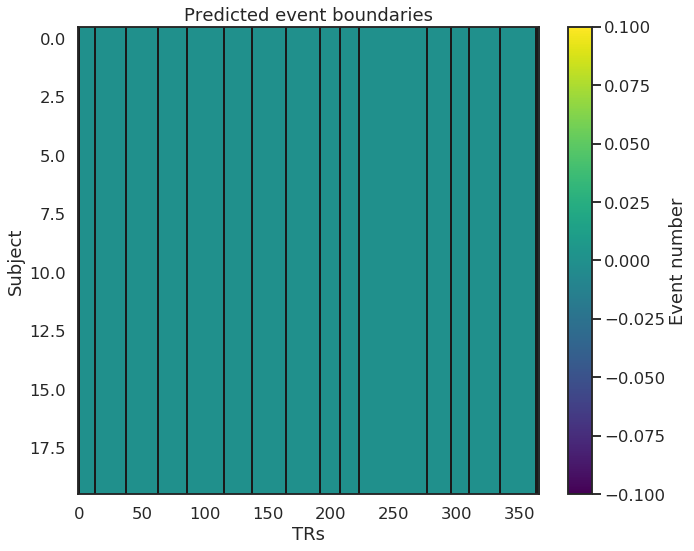

In [17]:
# plot predicted event states for every subject for this ROI / game
if ipynby==1: 
    f, ax = plt.subplots(1,1, figsize = (10,8))
    this_img=events_subj
    im=ax.imshow(this_img,interpolation='none', cmap='viridis', aspect='auto')
    ax.set_ylabel('Subject')
    ax.set_title('Predicted event boundaries')
    ax.set_xlabel('TRs')
    ax.vlines(true_edges,0-0.5,this_img.shape[0]-0.5) #true possession boundaries
    cbar=f.colorbar(im, orientation='vertical')
    cbar.set_label('Event number', rotation=90)
    f.tight_layout()
    fign=ss_dir+'pics/HMMBestk-EventBoundariesAllSubs-%s-%s.svg' %(task_name,roi_id)
    #f.savefig(fign)

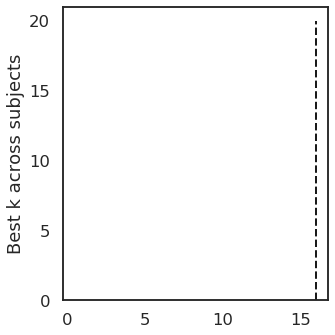

In [18]:
#plot best_k versus the actual number of possessions (dashed)
best_k_xsub=np.max(events_subj,axis=1)+1 #best K for each subject
if ipynby==1:
    f, ax = plt.subplots(1,1, figsize = (5,5))
    histbins=ax.hist(best_k_xsub) #create histogram
    ax.set_ylabel('Best k across subjects')
    ax.vlines(maxedges,0,np.max(histbins[0]),linestyles='dashed') #plot true # possessions
    f.tight_layout()
    fign=ss_dir+'pics/HMMBestk-Hist-%s-%s.svg' %(task_name,roi_id)
    #f.savefig(fign)

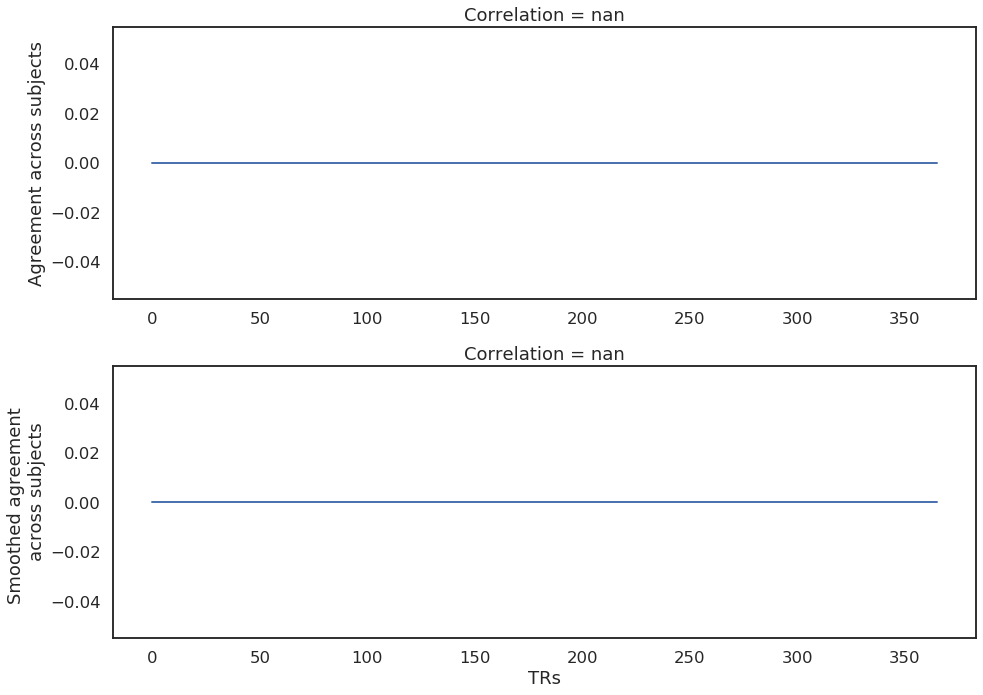

In [19]:
#find agreement between possession boundaries and the HMM, using best K  
#for the plots - note that these are not used in the paper / are incomplete because they are only one game
bounds_subj=np.zeros((nS,T)) #preset variables
bounds_subj_smooth=np.zeros((nS,T))
for subj in range(0,nS):
    bs=np.where(np.diff(events_subj[subj,:]))
    bounds_subj[subj,bs] = 1 #assign boundaries where events_subj changes
    #smooth w/ running mean
    bounds_subj_smooth[subj,:]=running_mean(bounds_subj[subj,:],smoothf,smoothshift) 

sum_bounds=np.mean(bounds_subj,axis=0) #average across subjects
sum_bounds_smooth=running_mean(sum_bounds,smoothf,smoothshift) # ", but smoothed

#run correlation between possession boundaries and the HMM
fill=np.corrcoef(sum_bounds,true_edges_cont)
agree_r=fill[1,0] #non-smoothed correlation
fill=np.corrcoef(sum_bounds_smooth,true_edges_cont)
smooth_agree_r=fill[1,0] #smoothed correlation
if ipynby==1: 
    f, ax = plt.subplots(2,1, figsize = (14,10)) 
    ax[0].plot(sum_bounds)
    ax[0].set_ylabel('Agreement across subjects')
    ax[0].set_title('Correlation = %s' %agree_r)
    ax[0].vlines(true_edges,0,np.max(sum_bounds),linestyles='dashed')
    ax[1].plot(sum_bounds_smooth)
    ax[1].set_ylabel('''Smoothed agreement 
    across subjects''')
    ax[1].set_title('Correlation = %s' %smooth_agree_r)
    ax[1].set_xlabel('TRs')
    ax[1].vlines(true_edges,0,np.max(sum_bounds_smooth),linestyles='dashed')
    f.tight_layout()
    fign=ss_dir+'pics/HMMagreementCorrs-bestk-%s-%s.svg' %(task_name,roi_id)
    #f.savefig(fign)

In [20]:
#grab HMM state boundary (/ univariate) values aligned to possession boundaries
#the logic is basically to save the MEAN values of HMM transitions w.r.t possession boundaries
#LATER (in XCond script) we will binarize this to find whether there is ANY HMM boundary or not
print(sumfill) #print # possessions
possHMMagree=np.zeros((sumfill))#preset variables
possHMM_xsub=np.zeros((nS,sumfill)) 
rg=15 #range w.r.t. boundary @ 0 over which to grab univariate data
axx=np.arange(-rg,rg+1)
HC_xsub_pre=np.zeros((nS,sumfill)) 
HC_xsub_post=np.zeros((nS,sumfill))
VTA2_xsub_pre=np.zeros((nS,sumfill)) 
preclust1=-12 #average for pre stim
preclust2=-8
postclust1=3 #average post values for HC
postclust2=12
vtaclust1=-2 #average pre for VTA
vtaclust2=-2
jjj=-1
for lt in range(T):
    if true_edges_cont[lt]>0: #at boundary
        jjj=jjj+1 #next boundary
        if lt-smoothf+smoothshift<0: #if too close to beginning of clip
            possHMMagree[jjj]=np.mean(sum_bounds_smooth[0:lt+smoothf+smoothshift+1]) 
        elif lt+smoothf+smoothshift+1>T: #if too close to end
            possHMMagree[jjj]=np.mean(sum_bounds_smooth[lt-smoothf+smoothshift:T])
        else: 
            possHMMagree[jjj]=np.mean(sum_bounds_smooth[lt-smoothf+smoothshift:lt+smoothf+smoothshift+1])
        for s in range(nS):
            if lt-smoothf+smoothshift<0:
                possHMM_xsub[s,jjj]=np.mean(bounds_subj[s,0:lt+smoothf+smoothshift+1]) 
            elif lt+smoothf+smoothshift+1>T:
                possHMM_xsub[s,jjj]=np.mean(bounds_subj[s,lt-smoothf+smoothshift:T])
            else:
                possHMM_xsub[s,jjj]=np.mean(bounds_subj[s,lt-smoothf+smoothshift:lt+smoothf+smoothshift+1])
            #find HC and VTA activation, in temporal clumps defined above
            if ROI_sel==0:
                if lt+preclust1<0:
                    HC_xsub_pre[s,jjj]=np.nanmean(HC_m[0:lt+preclust2+1,s])
                    HC_xsub_post[s,jjj]=np.nanmean(HC_m[lt+postclust1:lt+postclust2+1,s])
                elif lt+postclust2+1>T:
                    HC_xsub_pre[s,jjj]=np.nanmean(HC_m[lt+preclust1:lt+preclust2+1,s])
                    HC_xsub_post[s,jjj]=np.nanmean(HC_m[lt+postclust1:T,s])
                else:
                    HC_xsub_pre[s,jjj]=np.nanmean(HC_m[lt+preclust1:lt+preclust2+1,s])
                    HC_xsub_post[s,jjj]=np.nanmean(HC_m[lt+postclust1:lt+postclust2+1,s])
                if lt+vtaclust1<0:
                    VTA2_xsub_pre[s,jjj]=np.nanmean(VTA2_m[0:lt+vtaclust2+1,s])
                else:
                    VTA2_xsub_pre[s,jjj]=np.nanmean(VTA2_m[lt+vtaclust1:lt+vtaclust2+1,s])

16


In [21]:
#run correlation against amount of surprise rather than binary possession change(1/0)
ind=true_edges_cont_sur>0
fill=np.corrcoef(sum_bounds[ind],true_edges_cont_sur[ind])
agree_sur_r=fill[1,0] #non-smoothed
if np.isnan(agree_sur_r):
    agree_sur_r=0
ind_s=true_edges_cont_sur_smooth>0
fill=np.corrcoef(sum_bounds_smooth[ind_s],true_edges_cont_sur_smooth[ind_s])
smooth_agree_sur_r=fill[1,0] #smoothed
if np.isnan(smooth_agree_sur_r):
    smooth_agree_sur_r=0    

In [22]:
#find null distribution of scrambled boundaries
iters=1000
agree_iter_r=np.zeros((iters))
smooth_agree_iter_r=np.zeros((iters))
agree_iter_sur_r=np.zeros((iters))
smooth_agree_iter_sur_r=np.zeros((iters))
jj=0
while jj<iters:
    rps=np.random.permutation(poss_sizes.shape[0])
    true_edges_rp=np.cumsum(poss_sizes[rps]) #assign new edges
    true_edges_rp=np.hstack([0,true_edges_rp[:-1]]) #add 0 at beginning and cut last row to make similar to true_edges
    true_edges_rp_cont=[]
    true_edges_rp_cont=np.zeros((T))
    true_edges_rp_cont[true_edges_rp[1:].astype(int)]=1 #put in continuous space
    true_edges_rp_cont_smooth=running_max(true_edges_rp_cont,smoothf)
    true_edges_rp_cont_sur=np.zeros((T))
    true_edges_rp_cont_sur[true_edges_rp[1:].astype(int)]=true_edges_sur#[1:] JWA 11-2-19
    true_edges_rp_cont_sur_smooth=running_max(true_edges_rp_cont_sur,smoothf)
    
    fill=np.corrcoef(sum_bounds,true_edges_rp_cont)
    agree_iter_r[jj]=fill[1,0] #time course correlation for non-smooth
    if np.isnan(agree_iter_r[jj]):
        agree_iter_r[jj]=0
    fill=np.corrcoef(sum_bounds_smooth,true_edges_rp_cont_smooth)
    smooth_agree_iter_r[jj]=fill[1,0] #time course correlation for smooth
    if np.isnan(smooth_agree_iter_r[jj]):
        smooth_agree_iter_r[jj]=0
    ind=true_edges_rp_cont_sur>0
    fill=np.corrcoef(sum_bounds[ind],true_edges_rp_cont_sur[ind])
    agree_iter_sur_r[jj]=fill[1,0] #agreement vs surprise @ boundary, non-smooth
    if np.isnan(agree_iter_sur_r[jj]):
        agree_iter_sur_r[jj]=0
    ind_s=true_edges_rp_cont_sur_smooth>0
    fill=np.corrcoef(sum_bounds_smooth[ind_s],true_edges_rp_cont_sur_smooth[ind_s])
    smooth_agree_iter_sur_r[jj]=fill[1,0] #agreement vs surprise @ boundary, smooth
    if np.isnan(smooth_agree_iter_sur_r[jj]):
        smooth_agree_iter_sur_r[jj]=0
    if ~np.isnan(agree_iter_sur_r[jj]):
        jj=jj+1

In [23]:
#test true data vs null distribution
agree_rankd=stats.percentileofscore(agree_iter_r,agree_r) #find ranks
smooth_agree_rankd=stats.percentileofscore(smooth_agree_iter_r,smooth_agree_r)
agree_sur_rankd=stats.percentileofscore(agree_iter_sur_r,agree_sur_r)
smooth_agree_sur_rankd=stats.percentileofscore(smooth_agree_iter_sur_r,smooth_agree_sur_r)

In [24]:
D = np.transpose(bold_roi[task_name], [1,0,2])
D=D[zzmat,:,:]
print(D.shape)

(4264, 366, 20)


In [25]:
# test accuracy at the boundaries by testing within and across boundary correlations
# fit HMM with best K as the number of possessions
w = 10  # window size
nPerm = 1000
within_across = np.zeros((nS, nPerm+1))
for left_out in range(nS):
    k=int(best_k_xsub[left_out])
    if splitm:
        ev = brainiak.eventseg.event.EventSegment(k,split_merge=True) 
    else:
        ev = brainiak.eventseg.event.EventSegment(k)    
    ev.fit(D[:,:,np.arange(nS) != left_out].mean(2).T)
    events = np.argmax(ev.segments_[0], axis=1)

    corrs = np.zeros(nTR-w) # Compute correlations separated by w in time
    for t in range(nTR-w):
        corrs[t] = pearsonr(D[:,t,left_out],D[:,t+w,left_out])[0]
    _, event_lengths = np.unique(events, return_counts=True)

    # Compute within vs across boundary correlations, for real and permuted bounds
    np.random.seed(0)
    for p in range(nPerm+1):
        within = corrs[events[:-w] == events[w:]].mean()
        across = corrs[events[:-w] != events[w:]].mean()
        within_across[left_out, p] = within - across
        
        perm_lengths = np.random.permutation(event_lengths)
        events = np.zeros(nTR, dtype=np.int)
        events[np.cumsum(perm_lengths[:-1])] = 1
        events = np.cumsum(events)
    print('Subj ' + str(left_out+1) + ': within vs across = ' + str(within_across[left_out,0]))

Subj 1: within vs across = nan
Subj 2: within vs across = nan
Subj 3: within vs across = nan
Subj 4: within vs across = nan
Subj 5: within vs across = nan
Subj 6: within vs across = nan
Subj 7: within vs across = nan
Subj 8: within vs across = nan
Subj 9: within vs across = nan
Subj 10: within vs across = nan
Subj 11: within vs across = nan
Subj 12: within vs across = nan
Subj 13: within vs across = nan
Subj 14: within vs across = nan
Subj 15: within vs across = nan
Subj 16: within vs across = nan
Subj 17: within vs across = nan
Subj 18: within vs across = nan
Subj 19: within vs across = nan
Subj 20: within vs across = nan


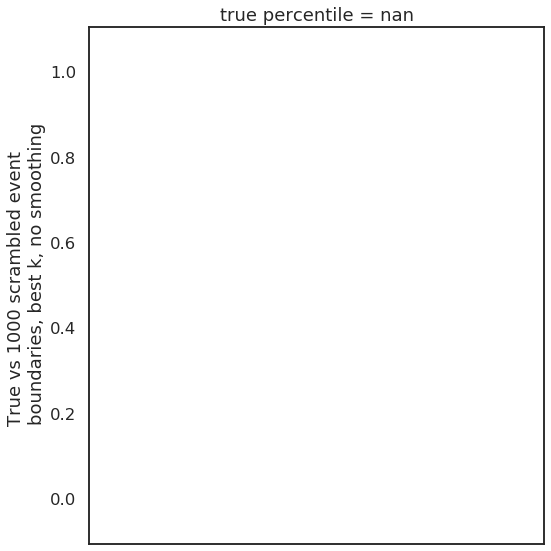

In [26]:
if ipynby==1: # plot true value vs scrambled distribution for within - across boundary correlation comparison
    f, ax = plt.subplots(1,1, figsize = (8,8))
    rankd=stats.percentileofscore(within_across[:,1:].mean(0),within_across[:,0].mean(0))
    yl='''True vs %s scrambled event 
    boundaries, best k, no smoothing''' %iters
    vplot(within_across[:,0].mean(0),within_across[:,1:].mean(0),yl,rankd,1,0)
    f.tight_layout()
    fign=ss_dir+'pics/HMMBestk-WithinVAcross-%s-%s.svg' %(task_name,roi_id)
    #f.savefig(fign)

In [27]:
#function to set up 2-D structure again but with best K boundaries!
def plot_tt_similarity_matrix2(ax, data_matrix, bounds, bounds_true, n_TRs):
    ax.imshow(np.corrcoef(data_matrix.T), cmap='viridis')
    ax.set_xlabel('TR')
    ax.set_ylabel('TR')
    # plot the predicted boundaries 
    bounds_aug = np.concatenate(([0],bounds,[n_TRs]))
    for i in range(len(bounds_aug)-1):
        rect = patches.Rectangle(
            (bounds_aug[i],bounds_aug[i]),
            bounds_aug[i+1]-bounds_aug[i],
            bounds_aug[i+1]-bounds_aug[i],
            linewidth=2,edgecolor='w',facecolor='none')
        ax.add_patch(rect)
    bounds_aug = np.concatenate(([0],bounds_true,[n_TRs]))
    for i in range(len(bounds_aug)-1):
        rect = patches.Rectangle(
            (bounds_aug[i],bounds_aug[i]),
            bounds_aug[i+1]-bounds_aug[i],
            bounds_aug[i+1]-bounds_aug[i],
            linewidth=2,edgecolor='r',facecolor='none')
        ax.add_patch(rect)

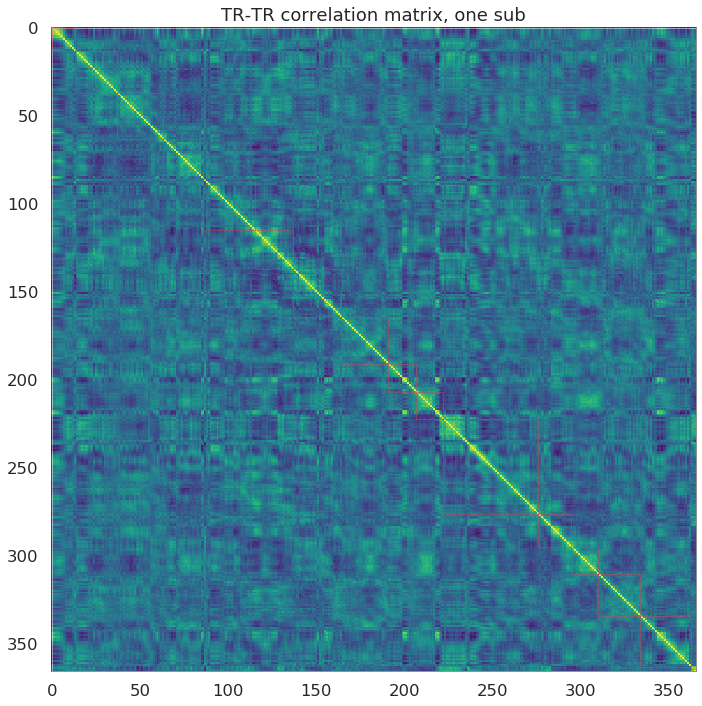

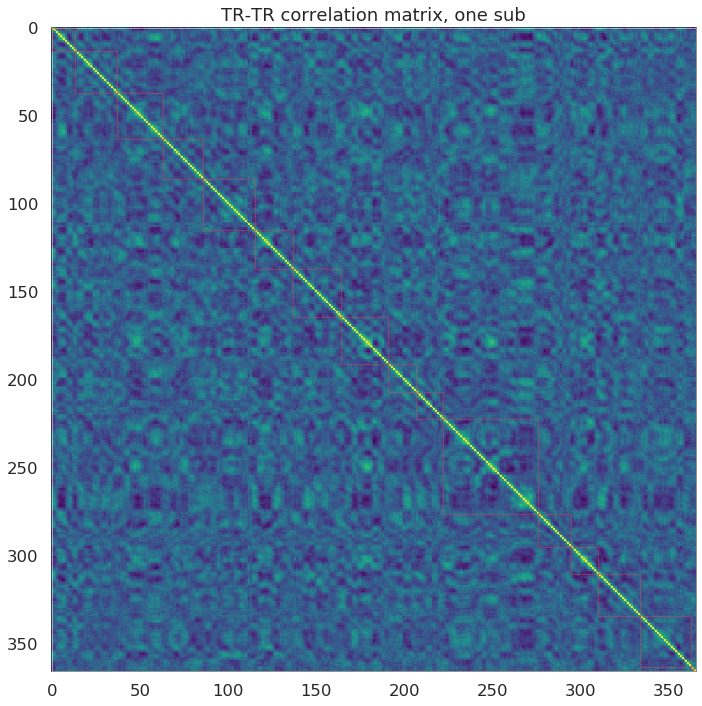

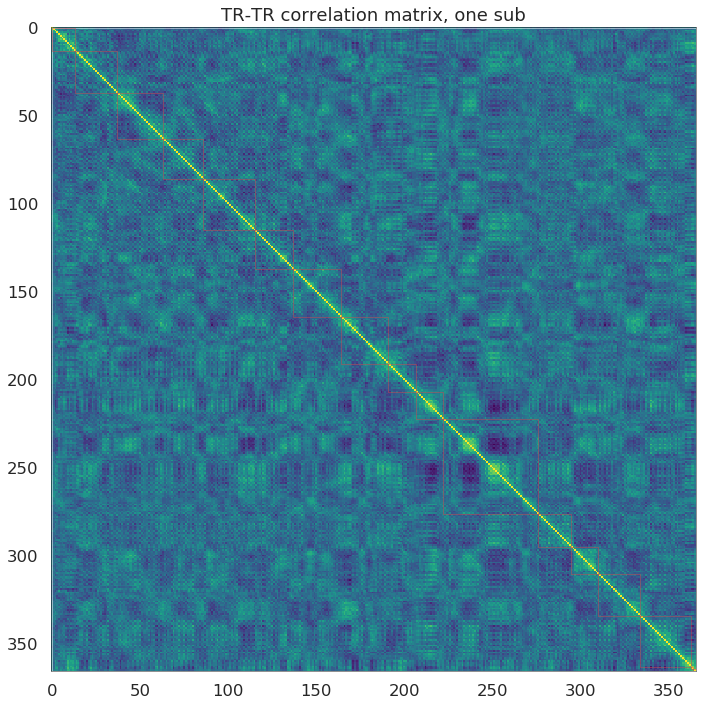

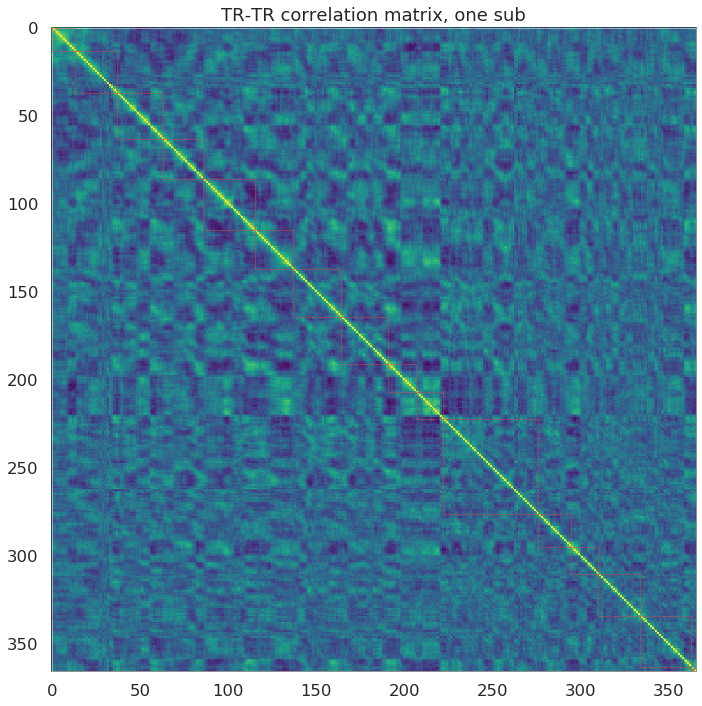

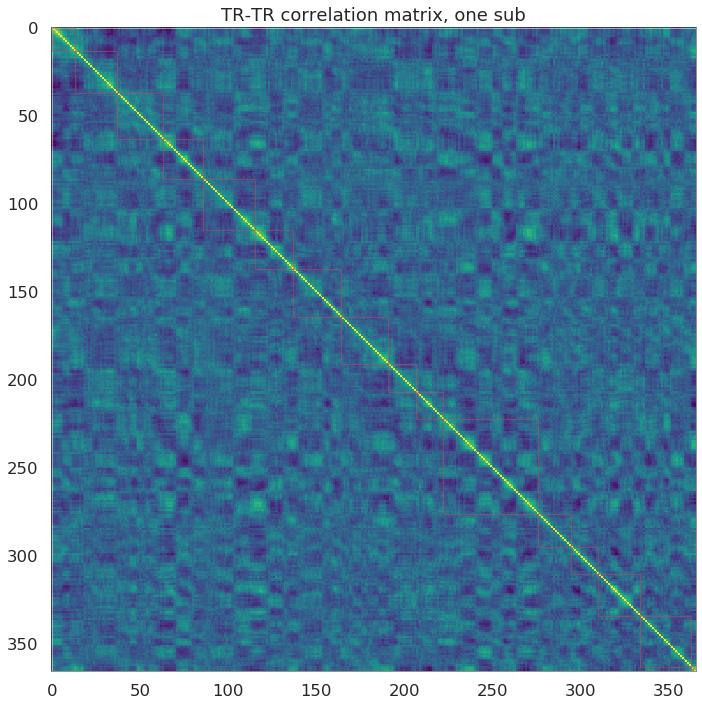

...

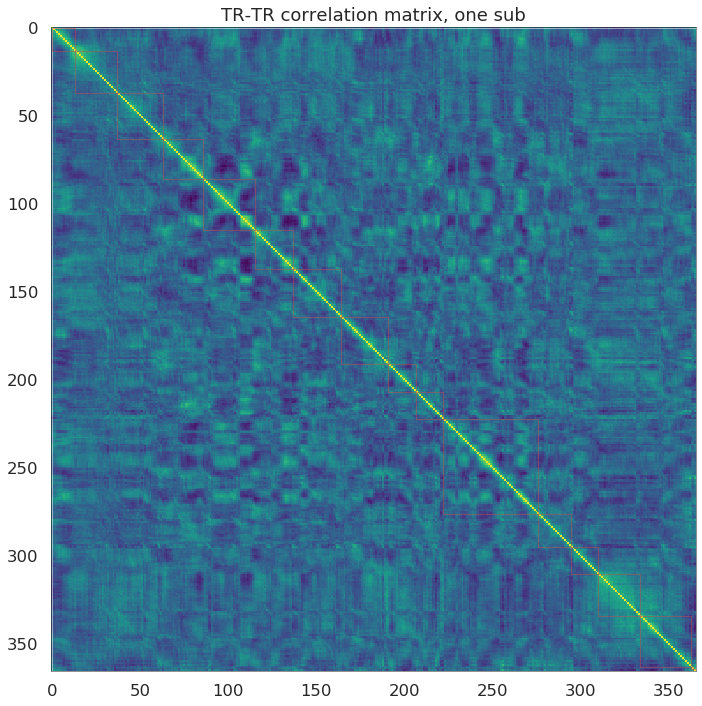

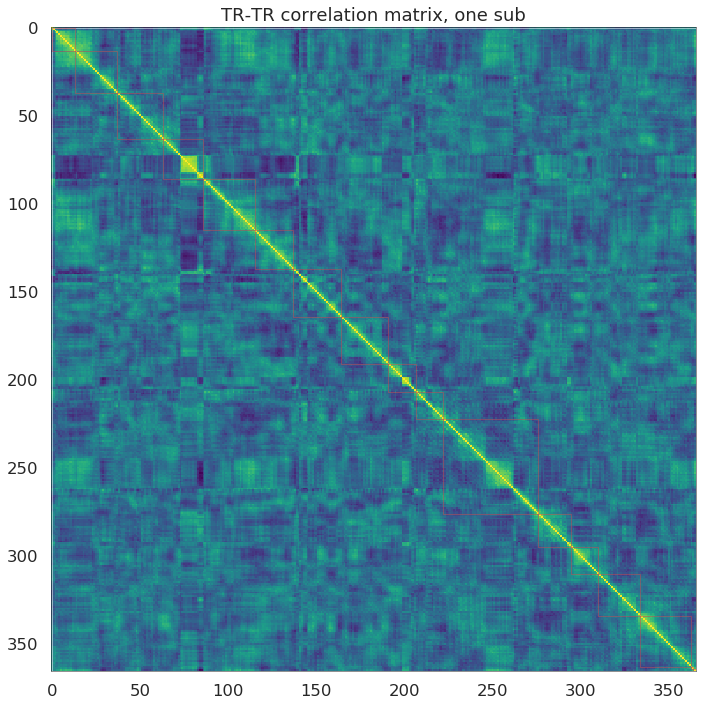

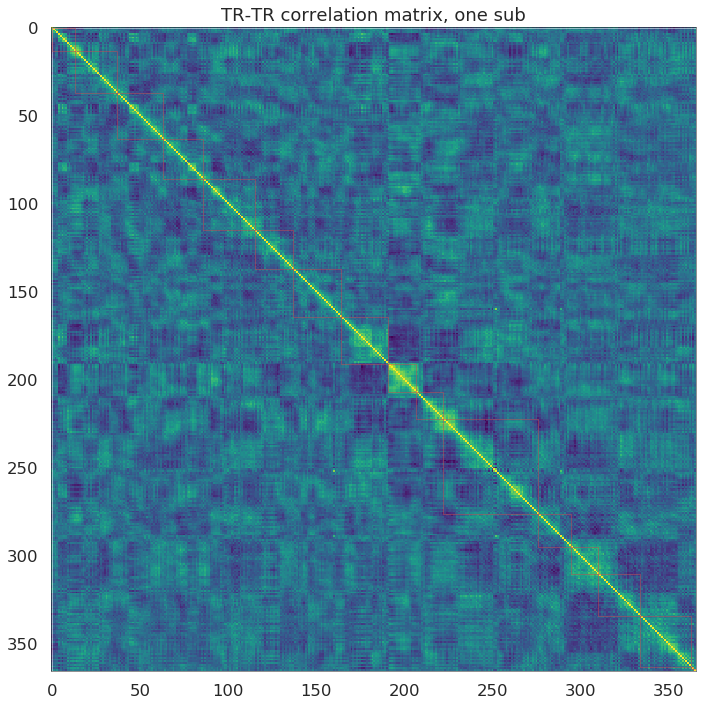

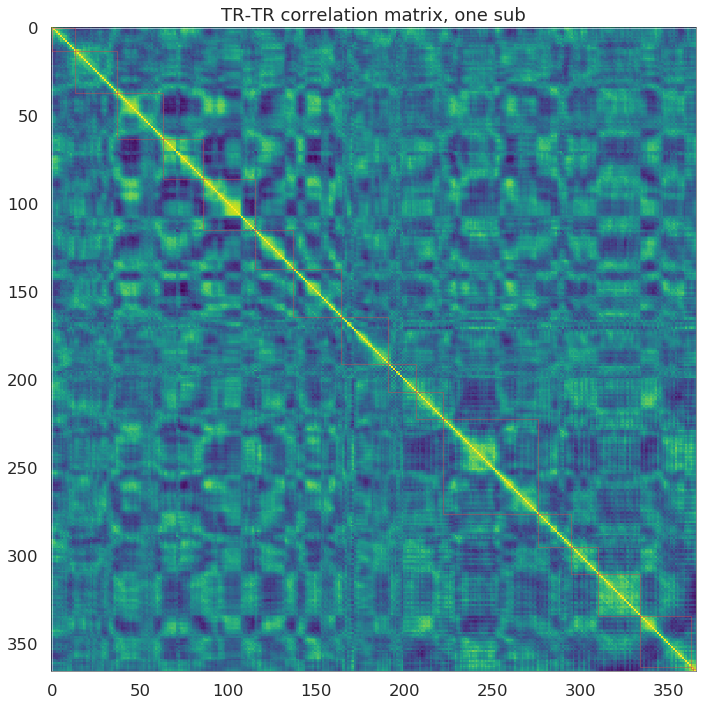

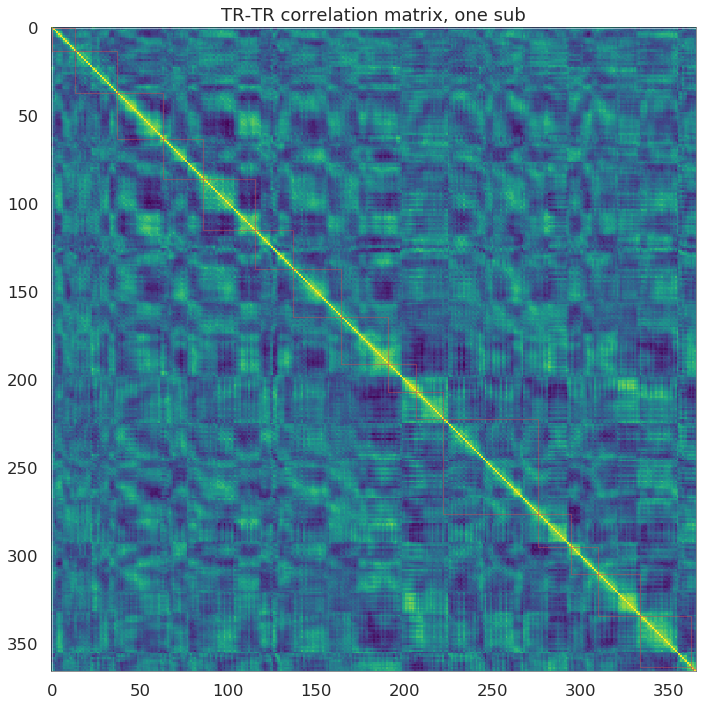

In [28]:
#plot each subject's boundaries vs. true possession boundaries
#creates Fig 3B, left side (when run separately for each ROI), using 1 subject
for subj in range(nS):
    D = bold_roi[task_name][:,zzmat,subj].T
    zmat=D[:,1]!=0
    D=D[zmat,:]
    bs=np.where(np.diff(events_subj[subj,:]))
    if ipynby==1:
        #if subj==0: # plot the data for sample subject
        f, ax = plt.subplots(1,1,figsize = (10,10))
        plot_tt_similarity_matrix(ax, D, bs[0],true_edges, T)
        f.tight_layout()
        fign=ss_dir+'pics/HMMBestk-OneSubPredOnly-%s-%s-%s.svg' %(task_name,roi_id,subj+1)
        #f.savefig(fign)
        title_text = '''TR-TR correlation matrix, one sub'''
        ax.set_title(title_text)

(4264, 366)
[]


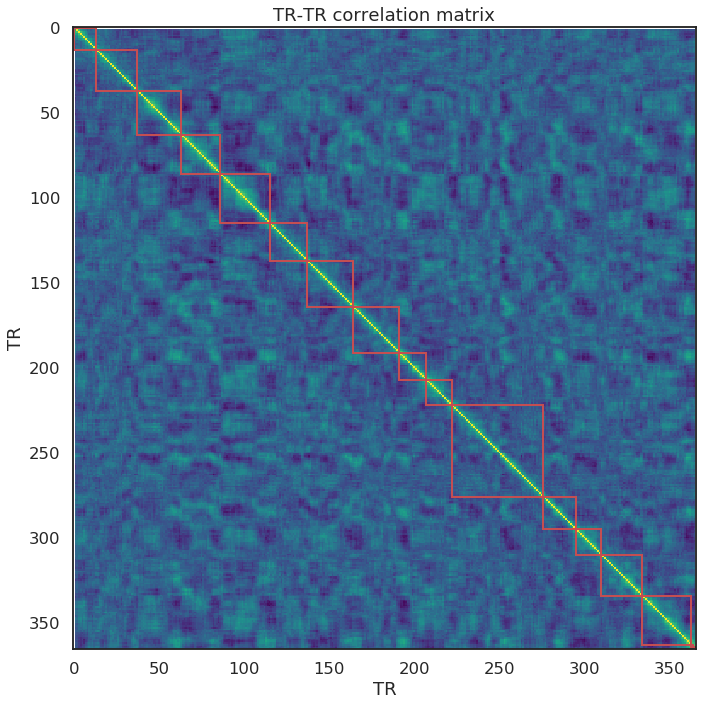

In [29]:
#plot MEAN TR-by-TR correlation matrix across subjects (true possession boundaries in gold)
D=np.mean(bold_roi[task_name][:,zzmat,:],axis=2)
D=D.T 
zmat=D[:,1]!=0
D=D[zmat,:]
print(D.shape) 
fill=np.mean(bounds_subj,axis=0)
fill0=np.where(fill>0)
print(fill0[0])
if ipynby==1:
    f, ax = plt.subplots(1,1,figsize = (10,10))
    plot_tt_similarity_matrix2(ax, D,[],true_edges, T)
    f.tight_layout()
    fign=ss_dir+'pics/HMMBestk-PredOnlyMean-%s-%s.svg' %(task_name,roi_id)
    #f.savefig(fign)
    title_text = '''TR-TR correlation matrix'''
    ax.set_title(title_text)

In [30]:
# save outputs as .mat
mat_fname=dir_out+'event_hmm129_out%s-%s-%s-%s-%s-%s-%s-%s-%s.mat' %(smoothf,smoothshift,n_trunc,hrshiftval,boundtype,task_name,roi_id,splitm,filtcutoff)
scipy.io.savemat(mat_fname,{'smoothf': smoothf,'smoothshift': smoothshift,'maxedges': maxedges,'true_edges': true_edges,'true_edges_edge': true_edges_edge,'true_edges_sur': true_edges_sur,
    'true_edges_cont': true_edges_cont,'true_edges_cont_smooth': true_edges_cont_smooth,
    'true_edges_cont_sur': true_edges_cont_sur,'true_edges_cont_sur_smooth': true_edges_cont_sur_smooth,
    'bounds_subj': bounds_subj,'bounds_subj_smooth': bounds_subj_smooth,
    'events_subj': events_subj,'lls_outer': lls_outer,'sum_bounds': sum_bounds,'sum_bounds_smooth': sum_bounds_smooth,'agree_r': agree_r,
    'smooth_agree_r': smooth_agree_r,'agree_sur_r': agree_sur_r,'smooth_agree_sur_r': smooth_agree_sur_r,
    'agree_iter_r': agree_iter_r,'smooth_agree_iter_r': smooth_agree_iter_r,
    'agree_iter_sur_r': agree_iter_sur_r,'smooth_agree_iter_sur_r': smooth_agree_iter_sur_r,'within_across': within_across,
    'agree_rankd': agree_rankd,'smooth_agree_rankd': smooth_agree_rankd,
    'agree_sur_rankd': agree_sur_rankd,'smooth_agree_sur_rankd': smooth_agree_sur_rankd,
    'possHMMagree': possHMMagree,'possHMM_xsub': possHMM_xsub,
    'HC_m':HC_m,'VTA2_m':VTA2_m,'NAcc_m':NAcc_m,'HC_xsub_pre':HC_xsub_pre,
    'HC_xsub_post':HC_xsub_post,'VTA2_xsub_pre':VTA2_xsub_pre,
})
mat_fname=dir_out+'event_hmm129_out_univ%s-%s-%s-%s-%s-%s-%s-%s-%s.mat' %(smoothf,smoothshift,n_trunc,hrshiftval,boundtype,task_name,roi_id,splitm,filtcutoff)
scipy.io.savemat(mat_fname,{
    'HC_m':HC_m,'VTA2_m':VTA2_m,'NAcc_m':NAcc_m,'HC_xsub_pre':HC_xsub_pre,
    'HC_xsub_post':HC_xsub_post,'VTA2_xsub_pre':VTA2_xsub_pre,
})

In [32]:
print('Current roitask: %s' %roitask)
print(mat_fname) #print to check filename in logfile if you scroll to bottom

Current roitask: 193
/jukebox/norman/jantony/surprisesuspense/data/bids/Norman/Antony/ss/derivatives/secondlevel/HMM/event_hmm129_out_univ7-0-3-5-0-view_gb5-Left Frontal Pole-1-140.mat
